In [1]:
using FilePaths, VegaLite, CSV, DataFrames, StatsKit, Plots, VegaDatasets, Query; gr();

path = "../data/2016-2022.csv"
df = DataFrame(CSV.File(path))

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision
,Int64,Int64,String15,Float64,String31,Int64,Int64
1,8912977,356,IND107923,107923.0,18 March 2022,2022,1
2,8912990,356,IND107846,107846.0,18 March 2022,2022,1
3,8913012,356,IND107941,107941.0,18 March 2022,2022,1
4,8913089,356,IND107842,107842.0,18 March 2022,2022,1
5,8913091,356,IND107850,107850.0,18 March 2022,2022,1
6,8913095,356,IND107873,107873.0,18 March 2022,2022,1
7,8913119,356,IND107754,107754.0,18 March 2022,2022,2
8,8913123,356,IND107752,107752.0,18 March 2022,2022,2
9,8913124,356,IND107723,107723.0,18 March 2022,2022,2


In [2]:
#wykorzystałam element kodu Hani by stworzyć mapki roczne
df_2018 = @from i in df begin
    @where i.year == 2018
    @select {i.event_date, i.event_type, i.sub_event_type, i.location, i.latitude, i.longitude}
    @collect DataFrame
end
df_2018

,event_date,event_type,sub_event_type,location,latitude
,String31,String31,String,String31,Float64
1,31 December 2018,Protests,Peaceful protest,Panaji,15.4957
2,31 December 2018,Protests,Peaceful protest,Alangayam,12.6279
3,31 December 2018,Protests,Peaceful protest,Puducherry,11.9338
4,31 December 2018,Protests,Peaceful protest,Salem,11.6511
5,31 December 2018,Protests,Peaceful protest,Kakinada,16.9603
6,31 December 2018,Protests,Peaceful protest,Erode,11.3428
7,31 December 2018,Protests,Peaceful protest,Visakhapatnam,17.68
8,31 December 2018,Violence against civilians,Attack,Chennai,13.0878
9,31 December 2018,Protests,Peaceful protest,Huzurnagar,16.901


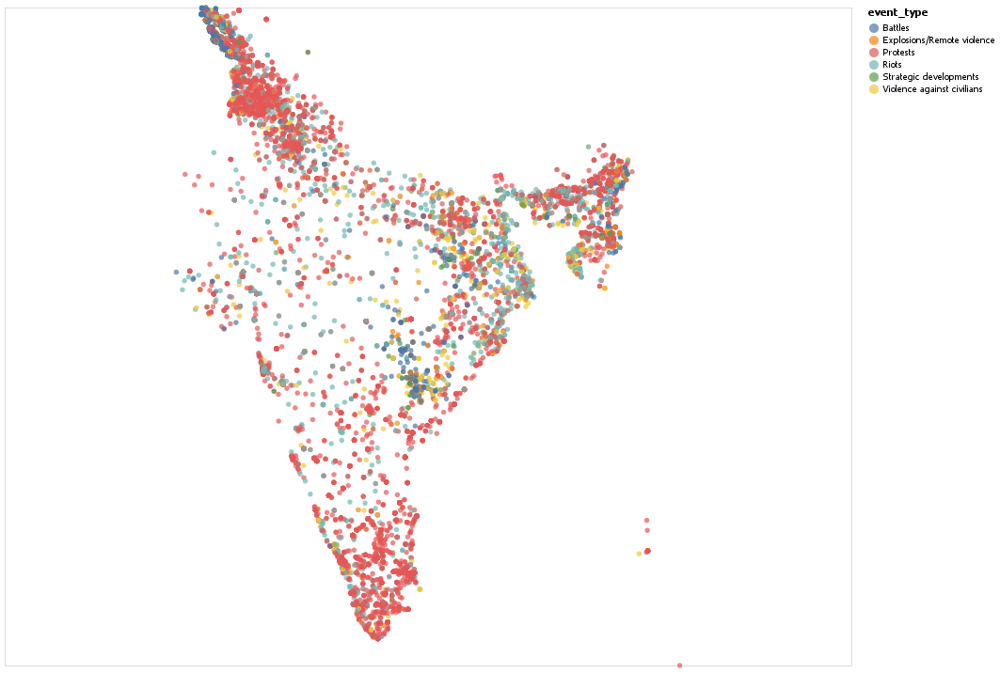

In [3]:
@vlplot(width=900, height=700) +
@vlplot(
    :circle,
    data=df_2018,
    projection={type=:equalEarth},
    longitude="longitude",
    latitude="latitude",
    color=:event_type,
)